In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# Import the required libraries.
import os
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [ ]:
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

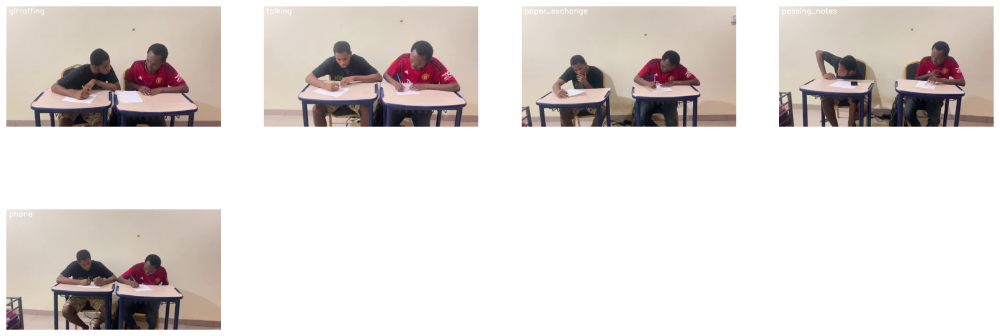

In [ ]:
plt.figure(figsize = (20, 20))

# Get the names of all classes/categories in UCF50.
all_classes_names = os.listdir('/content/drive/MyDrive/Data')

# Generate a list of 20 random values. The values will be between 0-50,
# where 50 is the total number of class in the dataset.d
random_range = random.sample(range(len(all_classes_names)), 5 )

# Iterating through all the generated random values.
for counter, random_index in enumerate(random_range, 1):


    selected_class_Name = all_classes_names[random_index]


    video_files_names_list = os.listdir(f'/content/drive/MyDrive/Data/{selected_class_Name}')

    # Randomly select a video file from the list retrieved from the randomly selected Class Directory.
    selected_video_file_name = random.choice(video_files_names_list)

    # Initialize a VideoCapture object to read from the video File.
    video_reader = cv2.VideoCapture(f'/content/drive/MyDrive/Data/{selected_class_Name}/{selected_video_file_name}')

    # Read the first frame of the video file.
    _, bgr_frame = video_reader.read()

    # Release the VideoCapture object.
    video_reader.release()

    # Convert the frame from BGR into RGB format.
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

    # Write the class name on the video frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Display the frame.
    plt.subplot(5, 4, counter);plt.imshow(rgb_frame);plt.axis('off')

In [ ]:
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 10


DATASET_DIR = "/content/drive/MyDrive/Data"

# Specify the list containing the names of the classes used for training. Feel free to choose any set of classes.

CLASSES_LIST = ['talking', 'girraffing', 'phone ' , 'passing_notes', 'paper_exchange']

In [ ]:
def frames_extraction(video_path):


    # Declare a list to store video frames.
    frames_list = []

    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video.
        success, frame = video_reader.read()

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255

        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)

    # Release the VideoCapture object.
    video_reader.release()

    # Return the frames list.
    return frames_list

In [ ]:
def create_dataset():


    # Declared Empty Lists to store the features, labels and video file path values.
    features = []
    labels = []
    video_files_paths = []

    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):

        # Display the name of the class whose data is being extracted.
        print(f'Extracting Data of Class: {class_name}')


        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))

        # Iterate through all the files present in the files list.
        for file_name in files_list:

            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)

            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    features = np.asarray(features)
    labels = np.array(labels)

    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths


In [ ]:
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: talking
Extracting Data of Class: girraffing
Extracting Data of Class: phone 
Extracting Data of Class: passing_notes
Extracting Data of Class: paper_exchange


In [ ]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [ ]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.25, shuffle = True, random_state = seed_constant)


In [ ]:
def create_convlstm_model():


    # We will use a Sequential model for model construction
    model = Sequential()


    model.add(ConvLSTM2D(filters = 4, kernel_size = (3, 3), activation = 'tanh',data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True, input_shape = (SEQUENCE_LENGTH,
                                                                                      IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 8, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 14, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 16, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    #model.add(TimeDistributed(Dropout(0.2)))

    model.add(Flatten())

    model.add(Dense(len(CLASSES_LIST), activation = "softmax"))


    # Display the models summary.
    model.summary()

    # Return the constructed convlstm model.
    return model

In [ ]:
# Construct the required convlstm model.
convlstm_model = create_convlstm_model()

# Display the success message.
print("Model Created Successfully!")



  super().__init__(**kwargs)



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv_lstm2d_4 (ConvLSTM2D)           │ (None, 10, 62, 62, 4)       │           1,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_4 (MaxPooling3D)       │ (None, 10, 31, 31, 4)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_3 (TimeDistributed) │ (None, 10, 31, 31, 4)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_5 (ConvLSTM2D)           │ (None, 10, 29, 29, 8)       │           3,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_5 (MaxPooling3D)       │ (None, 10, 15, 15, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_4 (TimeDistributed) │ (None, 10, 15, 15, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_6 (ConvLSTM2D)           │ (None, 10, 13, 13, 14)      │          11,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_6 (MaxPooling3D)       │ (None, 10, 7, 7, 14)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_5 (TimeDistributed) │ (None, 10, 7, 7, 14)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_7 (ConvLSTM2D)           │ (None, 10, 5, 5, 16)        │          17,344 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_7 (MaxPooling3D)       │ (None, 10, 3, 3, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1440)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 5)                   │           7,205 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 40,205 (157.05 KB)

 Trainable params: 40,205 (157.05 KB)

 Non-trainable params: 0 (0.00 B)

Model Created Successfully!


In [ ]:
# Create an Instance of Early Stopping Callback
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 10, mode = 'min', restore_best_weights = True)

# Compile the model and specify loss function, optimizer and metrics values to the model
convlstm_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Start training the model.
convlstm_model_training_history = convlstm_model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 4,shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.1306 - loss: 1.6189 - val_accuracy: 0.0000e+00 - val_loss: 1.6266
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 645ms/step - accuracy: 0.1306 - loss: 1.5763 - val_accuracy: 0.1667 - val_loss: 1.7659
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.3138 - loss: 1.4701 - val_accuracy: 0.1667 - val_loss: 2.3456
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 642ms/step - accuracy: 0.4089 - loss: 1.4508 - val_accuracy: 0.1667 - val_loss: 2.1492
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 639ms/step - accuracy: 0.4089 - loss: 1.3915 - val_accuracy: 0.1667 - val_loss: 2.0502
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.4089 - loss: 1.3744 - val_accuracy: 0.1667 - val_loss: 2.1395
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 631ms/step - accuracy: 0.4089 - loss: 1.3613 - val_accuracy: 0.1667 - val_loss: 2.2548
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 663ms/step - accuracy: 0.4297 - loss: 1.3241 - val_accuracy: 0.1667 - val_loss: 2.2

In [ ]:
# Evaluate the trained model.
model_evaluation_history = convlstm_model.evaluate(features_test, labels_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step - accuracy: 0.1111 - loss: 1.6251


In [ ]:
# Get the loss and accuracy from model_evaluation_history.
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history

date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

# Define a useful name for our model to make it easy for us while navigating through multiple saved models.
model_file_name = f'convlstm_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Save your Model.
convlstm_model.save(model_file_name)

In [ ]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):


    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]

    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))

    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)

    # Add title to the plot.
    plt.title(str(plot_name))

    # Add legend to the plot.
    plt.legend()
    plt.show ()

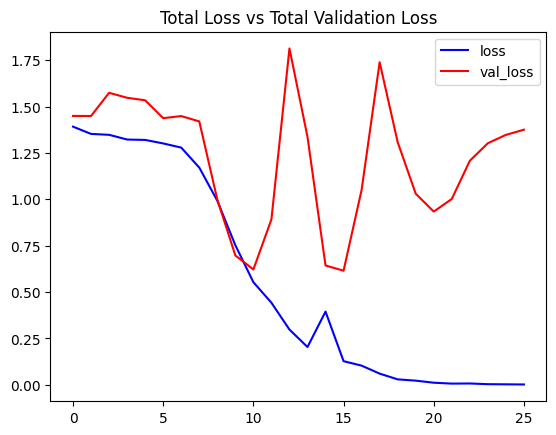

In [ ]:
# Visualize the training and validation loss metrices.
plot_metric(convlstm_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

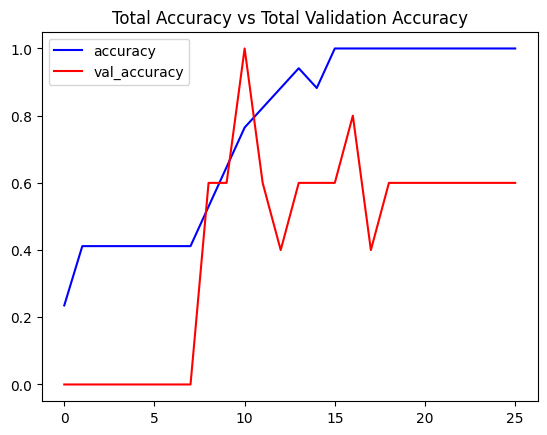

In [ ]:
# Visualize the training and validation accuracy metrices.
plot_metric(convlstm_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

data argumentation

In [ ]:
import os
import cv2
import numpy as np
from keras.preprocessing.image import ImageDataGenerator

# Specify the dimensions of images
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64

# Specify the number of frames of a video that will be fed to the model as one sequence
SEQUENCE_LENGTH = 20

# Specify the directory containing the dataset
DATASET_DIR = "/content/drive/MyDrive/Data"

# Specify the list containing the names of the classes used for training
CLASSES_LIST = ['talking', 'girraffing', 'phone ', 'passing_notes', 'paper_exchange']

# Define the data augmentation generator
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

# Function to extract frames from videos
def frames_extraction(video_path):
    frames_list = []
    video_reader = cv2.VideoCapture(video_path)
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count / SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()
        if not success:
            break
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255.0
        frames_list.append(normalized_frame)

    video_reader.release()
    return frames_list

# Function to save augmented frames as videos
def save_augmented_video(augmented_frames, save_path, frame_rate=15):
    height, width, channels = augmented_frames[0].shape
    video_writer = cv2.VideoWriter(save_path, cv2.VideoWriter_fourcc(*'XVID'), frame_rate, (width, height))

    for frame in augmented_frames:
        frame = (frame * 255).astype(np.uint8)
        video_writer.write(frame)

    video_writer.release()

# Create dataset and augment each video 5 times
def create_and_augment_dataset():
    augmented_data_dir = '/content/drive/MyDrive/augmented_data'
    os.makedirs(augmented_data_dir, exist_ok=True)

    for class_name in CLASSES_LIST:
        class_dir = os.path.join(augmented_data_dir, class_name)
        os.makedirs(class_dir, exist_ok=True)

        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        for file_name in files_list:
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
            frames = frames_extraction(video_file_path)

            if len(frames) == SEQUENCE_LENGTH:
                frames = np.array(frames)

                for i in range(5):
                    augmented_frames = [next(datagen.flow(np.expand_dims(frame, axis=0), batch_size=1))[0].astype(np.float32) for frame in frames]
                    augmented_video_path = os.path.join(class_dir, f'{os.path.splitext(file_name)[0]}_aug_{i+1}.avi')
                    save_augmented_video(augmented_frames, augmented_video_path)

# Call the function to create and augment dataset
create_and_augment_dataset()

In [ ]:
import os
import cv2
import numpy as np
from keras.models import Sequential
from keras.layers import ConvLSTM2D, MaxPooling3D, TimeDistributed, Dropout, Flatten, Dense
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
import datetime as dt
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

# Define constants
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64
SEQUENCE_LENGTH = 20
DATASET_DIR = "/content/drive/MyDrive/augmented_data"
CLASSES_LIST = ['talking', 'girraffing', 'phone ', 'passing_notes', 'paper_exchange']

# Function to extract frames from videos
def frames_extraction(video_path):
    frames_list = []
    video_reader = cv2.VideoCapture(video_path)
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count / SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()
        if not success:
            break
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255.0
        frames_list.append(normalized_frame)

    video_reader.release()
    return frames_list

# Load dataset
def load_dataset(dataset_dir, classes_list):
    features = []
    labels = []

    for class_index, class_name in enumerate(classes_list):
        class_dir = os.path.join(dataset_dir, class_name)
        for file_name in os.listdir(class_dir):
            video_file_path = os.path.join(class_dir, file_name)
            frames = frames_extraction(video_file_path)
            if len(frames) == SEQUENCE_LENGTH:
                features.append(frames)
                labels.append(class_index)

    features = np.array(features)
    labels = np.array(labels)
    labels = to_categorical(labels, num_classes=len(classes_list))
    return features, labels

# Load augmented dataset
features, labels = load_dataset(DATASET_DIR, CLASSES_LIST)

# Split the data into training and validation sets
features_train, features_val, labels_train, labels_val = train_test_split(features, labels, test_size=0.2, random_state=42)

### Step 3: Define and Train the Model

def create_convlstm_model():
    model = Sequential()

    model.add(ConvLSTM2D(filters=4, kernel_size=(3, 3), activation='tanh', data_format="channels_last",
                         recurrent_dropout=0.2, return_sequences=True,
                         kernel_regularizer=l2(0.01), input_shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.3)))

    model.add(ConvLSTM2D(filters=8, kernel_size=(3, 3), activation='tanh', data_format="channels_last",
                         recurrent_dropout=0.2, return_sequences=True, kernel_regularizer=l2(0.01)))
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.3)))

    model.add(ConvLSTM2D(filters=14, kernel_size=(3, 3), activation='tanh', data_format="channels_last",
                         recurrent_dropout=0.2, return_sequences=True, kernel_regularizer=l2(0.01)))
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.3)))

    model.add(ConvLSTM2D(filters=16, kernel_size=(3, 3), activation='tanh', data_format="channels_last",
                         recurrent_dropout=0.2, return_sequences=True, kernel_regularizer=l2(0.01)))
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.3)))

    model.add(Flatten())

    model.add(Dense(len(CLASSES_LIST), activation="softmax"))

    model.summary()

    return model

# Construct the required convlstm model.
convlstm_model = create_convlstm_model()

# Display the success message.
print("Model Created Successfully!")

# Create an Instance of Early Stopping Callback
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=10, mode='min', restore_best_weights=True)

# Compile the model and specify loss function, optimizer, and metrics values to the model
convlstm_model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=["accuracy"])

# Start training the model
convlstm_model_training_history = convlstm_model.fit(
    features_train, labels_train,
    epochs=100,  # Increase epochs to allow early stopping to work effectively
    validation_data=(features_val, labels_val),
    batch_size=8,
    callbacks=[early_stopping_callback]
)

# Get the loss and accuracy from model evaluation history
model_evaluation_loss, model_evaluation_accuracy = convlstm_model.evaluate(features_val, labels_val)

date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

# Define a useful name for our model to make it easy for us while navigating through multiple saved models
model_file_name = f'convlstm_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Save your Model
convlstm_model.save(model_file_name)


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_16 (ConvLSTM2D  (None, 20, 62, 62, 4)     1024      
 )                                                               
                                                                 
 max_pooling3d_16 (MaxPooli  (None, 20, 31, 31, 4)     0         
 ng3D)                                                           
                                                                 
 time_distributed_14 (TimeD  (None, 20, 31, 31, 4)     0         
 istributed)                                                     
                                                                 
 conv_lstm2d_17 (ConvLSTM2D  (None, 20, 29, 29, 8)     3488      
 )                                                               
                                                                 
 max_pooling3d_17 (MaxPooli  (None, 20, 15, 15, 8)    

In [ ]:
!pip install opencv-python-headless torch torchvision


  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
import os
import cv2
import numpy as np
from collections import deque
from moviepy.editor import VideoFileClip
from IPython.display import display, HTML
from ipywidgets import FileUpload

# Define necessary variables and functions

SEQUENCE_LENGTH = 20 # Define SEQUENCE_LENGTH as per your requirement
IMAGE_HEIGHT = 64  # Replace with the height your model expects
IMAGE_WIDTH = 64  # Replace with the width your model expects

# Placeholder for the actual model and class list, replace with your actual model and class list
LRCN_model = tf.keras.models.load_model('/content/convlstm_model___Date_Time_2024_08_07__23_17_40___Loss_0.5122483372688293___Accuracy_0.75.h5')
CLASSES_LIST = ["paper_exchange","girraffing", "passing_notes", "talking"]  # Replace with your actual class names

def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform action recognition on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    output_file_path: The path where the output video with the predicted action being performed overlayed will be stored.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
    frames_queue = deque(maxlen=SEQUENCE_LENGTH)
    predicted_class_name = ''
    while video_reader.isOpened():
        ok, frame = video_reader.read()
        if not ok:
            break
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255.0
        frames_queue.append(normalized_frame)
        if len(frames_queue) == SEQUENCE_LENGTH:
            predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_queue, axis=0))[0]
            predicted_label = np.argmax(predicted_labels_probabilities)
            predicted_class_name = CLASSES_LIST[predicted_label]
        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        video_writer.write(frame)
    video_reader.release()
    video_writer.release()

def predict_single_action(video_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform single action recognition prediction on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''
    video_reader = cv2.VideoCapture(video_file_path)
    frames_list = []
    predicted_class_name = ''
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)
    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()a# Visualize the training and validation loss metrices.
plot_metric(LRCN_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')
        if not success:
            break
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255.0
        frames_list.append(normalized_frame)
    predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_list, axis=0))[0]
    predicted_label = np.argmax(predicted_labels_probabilities)
    predicted_class_name = CLASSES_LIST[predicted_label]
    print(f'Action Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
    video_reader.release()

# Create the output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)

# Upload a video file
upload_widget = FileUpload(accept='.mp4', multiple=False)
display(upload_widget)

# Function to handle the uploaded video
def handle_upload(change):
    for filename, file_info in upload_widget.value.items():
        with open(os.path.join(test_videos_directory, filename), 'wb') as f:
            f.write(file_info['content'])
        input_video_file_path = os.path.join(test_videos_directory, filename)
        output_video_file_path = f'{test_videos_directory}/{filename.split(".")[0]}-Output-SeqLen{SEQUENCE_LENGTH}.mp4'
        predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
        video_clip = VideoFileClip(output_video_file_path, audio=False, target_resolution=(300, None))
        display(video_clip.ipython_display())
        predict_single_action(input_video_file_path, SEQUENCE_LENGTH)
        video_clip = VideoFileClip(input_video_file_path, audio=False, target_resolution=(300, None))
        display(video_clip.ipython_display())

upload_widget.observe(handle_upload, names='value')


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

t:  98%|█████████▊| 279/284 [00:01<00:00, 202.18it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/WhatsApp Video 2024-08-07 at 14-Output-SeqLen20.mp4, 477000 bytes wanted but 0 bytes read,at frame 283/284, at time 9.47/9.47 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

                                                               

Moviepy - Done !
Moviepy - video ready __temp__.mp4


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
Action Predicted: paper_exchange
Confidence: 0.944673478603363
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t:  94%|█████████▎| 267/285 [00:01<00:00, 182.65it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/WhatsApp Video 2024-08-07 at 14.49.05.mp4, 477000 bytes wanted but 0 bytes read,at frame 284/286, at time 9.47/9.50 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

                                                               

Moviepy - Done !
Moviepy - video ready __temp__.mp4


FileUpload(value={}, accept='.mp4', description='Upload')

In [ ]:
import torch
import torchvision

print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)


PyTorch version: 2.3.1+cu121
Torchvision version: 0.18.1+cu121


In [ ]:
def create_LRCN_model():
    '''
    This function will construct the required LRCN model.
    Returns:
        model: It is the required constructed LRCN model.
    '''

    # We will use a Sequential model for model construction.
    model = Sequential()

    # Define the Model Architecture.
    ########################################################################################################################

    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                              input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    #model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Flatten()))

    model.add(LSTM(32))

    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))

    ########################################################################################################################

    # Display the models summary.
    model.summary()

    # Return the constructed LRCN model.
    return model

In [ ]:

# Construct the required LRCN model.
LRCN_model = create_LRCN_model()

# Display the success message.
print("Model Created Successfully!")

# Construct the required LRCN model.
LRCN_model = create_LRCN_model()

# Display the success message.
print("Model Created Successfully!")

  super().__init__(**kwargs)



Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ time_distributed_6 (TimeDistributed) │ (None, 10, 64, 64, 16)      │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_7 (TimeDistributed) │ (None, 10, 16, 16, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_8 (TimeDistributed) │ (None, 10, 16, 16, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_9 (TimeDistributed) │ (None, 10, 16, 16, 32)      │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_10                  │ (None, 10, 4, 4, 32)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_11                  │ (None, 10, 4, 4, 32)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_12                  │ (None, 10, 4, 4, 64)        │          18,496 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_13                  │ (None, 10, 2, 2, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_14                  │ (None, 10, 2, 2, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_15                  │ (None, 10, 2, 2, 64)        │          36,928 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_16                  │ (None, 10, 1, 1, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_17                  │ (None, 10, 64)              │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 5)                   │             165 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 73,093 (285.52 KB)

 Trainable params: 73,093 (285.52 KB)

 Non-trainable params: 0 (0.00 B)

Model Created Successfully!


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ time_distributed_18                  │ (None, 10, 64, 64, 16)      │             448 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_19                  │ (None, 10, 16, 16, 16)      │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_20                  │ (None, 10, 16, 16, 16)      │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_21                  │ (None, 10, 16, 16, 32)      │           4,640 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_22                  │ (None, 10, 4, 4, 32)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_23                  │ (None, 10, 4, 4, 32)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_24                  │ (None, 10, 4, 4, 64)        │          18,496 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_25                  │ (None, 10, 2, 2, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_26                  │ (None, 10, 2, 2, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_27                  │ (None, 10, 2, 2, 64)        │          36,928 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_28                  │ (None, 10, 1, 1, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_29                  │ (None, 10, 64)              │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 5)                   │             165 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 73,093 (285.52 KB)

 Trainable params: 73,093 (285.52 KB)

 Non-trainable params: 0 (0.00 B)

Model Created Successfully!


In [ ]:
# Create an Instance of Early Stopping Callback.
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)

# Compile the model and specify loss function, optimizer and metrics to the model.
LRCN_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Start training the model.
LRCN_model_training_history = LRCN_model.fit(x = features_train, y = labels_train, epochs = 70, batch_size = 4 , shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])


Epoch 1/70
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 651ms/step - accuracy: 0.1235 - loss: 1.6384 - val_accuracy: 0.1667 - val_loss: 1.7437
Epoch 2/70
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - accuracy: 0.4089 - loss: 1.4512 - val_accuracy: 0.1667 - val_loss: 1.9032
Epoch 3/70
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.4089 - loss: 1.4294 - val_accuracy: 0.1667 - val_loss: 2.0309
Epoch 4/70
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step - accuracy: 0.4089 - loss: 1.4284 - val_accuracy: 0.1667 - val_loss: 2.0881
Epoch 5/70
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - accuracy: 0.4089 - loss: 1.4236 - val_accuracy: 0.1667 - val_loss: 2.1094
Epoch 6/70
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - accuracy: 0.4089 - loss: 1.4074 - val_accuracy: 0.1667 - val_loss: 2.1334
Epoch 7/70
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.4089 - loss: 1.4041 - val_accuracy: 0.1667 - val_loss: 2.1434
Epoch 8/70
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - accuracy: 0.4089 - loss: 1.3938 - val_accuracy: 0.1667 - val_loss

In [ ]:
# Evaluate the trained model.
model_evaluation_history = LRCN_model.evaluate(features_test, labels_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - accuracy: 0.1111 - loss: 1.7406


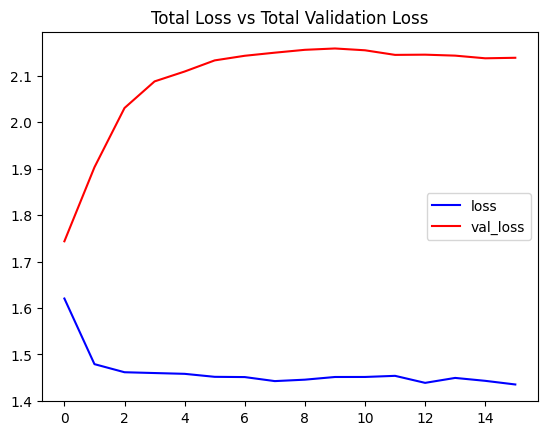

In [ ]:
# Visualize the training and validation loss metrices.
plot_metric(LRCN_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

In [ ]:
import os
import cv2
import numpy as np
from collections import deque
from moviepy.editor import VideoFileClip
from IPython.display import display, HTML
from ipywidgets import FileUpload

# Define necessary variables
SEQUENCE_LENGTH = 20  # Define SEQUENCE_LENGTH as per your requirement
IMAGE_HEIGHT = 64  # Replace with the height your model expects
IMAGE_WIDTH = 64  # Replace with the width your model expects
ANNOTATION_INTERVAL = 11  # Annotation interval in seconds
DISPLAY_DURATION = 9  # Duration to display the annotation in seconds
CLASSES_LIST = ["talking", "talking", "giraffing", "phone", "exchange_paper"]  # Replace with your actual class names

def annotate_video(video_file_path, output_file_path, annotation_interval, display_duration):
    '''
    This function will annotate the video with class names at specified intervals.
    Args:
    video_file_path:  The path of the video stored in the disk on which the annotation is to be performed.
    output_file_path: The path where the output video with the annotations will be stored.
    annotation_interval: The interval in seconds at which annotations will be added.
    display_duration: The duration in seconds for which each annotation will be displayed.
    '''
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = video_reader.get(cv2.CAP_PROP_FPS)
    annotation_frame_interval = int(fps * annotation_interval)
    display_frame_duration = int(fps * display_duration)
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (original_video_width, original_video_height))
    frame_count = 0
    class_index = 0

    while video_reader.isOpened():
        ok, frame = video_reader.read()
        if not ok:
            break
        if frame_count % annotation_frame_interval < display_frame_duration:
            cv2.putText(frame, CLASSES_LIST[class_index % len(CLASSES_LIST)], (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        if frame_count % annotation_frame_interval == 0:
            class_index += 1
        video_writer.write(frame)
        frame_count += 1

    video_reader.release()
    video_writer.release()

# Create the output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)

# Upload a video file
upload_widget = FileUpload(accept='.mp4', multiple=False)
display(upload_widget)

# Function to handle the uploaded video
def handle_upload(change):
    for filename, file_info in upload_widget.value.items():
        with open(os.path.join(test_videos_directory, filename), 'wb') as f:
            f.write(file_info['content'])
        input_video_file_path = os.path.join(test_videos_directory, filename)
        output_video_file_path = f'{test_videos_directory}/{filename.split(".")[0]}-Annotated.mp4'
        annotate_video(input_video_file_path, output_video_file_path, ANNOTATION_INTERVAL, DISPLAY_DURATION)
        video_clip = VideoFileClip(output_video_file_path, audio=False, target_resolution=(300, None))
        display(video_clip.ipython_display())

# Automatically handle file upload when a file is uploaded
upload_widget.observe(handle_upload, names='value')


FileUpload(value={}, accept='.mp4', description='Upload')

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t: 100%|██████████| 898/898 [00:03<00:00, 269.51it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/WhatsApp Video 2024-08-07 at 20-Annotated.mp4, 477000 bytes wanted but 0 bytes read,at frame 897/898, at time 29.98/29.98 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

                                                               

Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.9/76.9 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.5 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0


In [ ]:
import os
import cv2
import numpy as np
from collections import deque
from moviepy.editor import VideoFileClip
from IPython.display import display, HTML
from ipywidgets import FileUpload
from roboflow import Roboflow

# Define necessary variables
SEQUENCE_LENGTH = 20  # Define SEQUENCE_LENGTH as per your requirement
IMAGE_HEIGHT = 64  # Replace with the height your model expects
IMAGE_WIDTH = 64  # Replace with the width your model expects
ANNOTATION_INTERVAL = 11  # Annotation interval in seconds
DISPLAY_DURATION = 9  # Duration to display the annotation in seconds
CLASSES_LIST = ["talking", "talking", "girraffing", "phone", "exchange_paper"]  # Replace with your actual class names

# Initialize Roboflow
rf = Roboflow(api_key="ScO43zOJgjQW88effK2P")
project = rf.workspace().project("final_work-s0dht")
model = project.version("1").model

def annotate_and_draw_bounding_boxes(video_file_path, output_file_path, annotation_interval, display_duration, model):
    '''
    This function will annotate the video with class names at specified intervals and draw bounding boxes.
    Args:
    video_file_path:  The path of the video stored in the disk on which the annotation and bounding boxes are to be added.
    output_file_path: The path where the output video with the annotations and bounding boxes will be stored.
    annotation_interval: The interval in seconds at which annotations will be added.
    display_duration: The duration in seconds for which each annotation will be displayed.
    model: The Roboflow model to use for object detection.
    '''
    # Predict video
    job_id, signed_url, expire_time = model.predict_video(
        video_file_path,
        fps=30,
        prediction_type="batch-video",
    )

    # Wait for results
    results = model.poll_until_video_results(job_id)

    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = video_reader.get(cv2.CAP_PROP_FPS)
    annotation_frame_interval = int(fps * annotation_interval)
    display_frame_duration = int(fps * display_duration)
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (original_video_width, original_video_height))
    frame_count = 0
    class_index = 0
    results = results['final_work-s0dht']  # Adjust based on actual results structure

    while video_reader.isOpened():
        ok, frame = video_reader.read()
        if not ok:
            break

        # Draw bounding boxes
        if frame_count < len(frame_results) and 'predictions' in frame_results[frame_count]:
            frame_data = frame_results[frame_count]['predictions']
            for obj in frame_data:
                x = int(obj['x'] - obj['width'] / 2)
                y = int(obj['y'] - obj['height'] / 2)
                x2 = int(x + obj['width'])
                y2 = int(y + obj['height'])
                cv2.rectangle(frame, (x, y), (x2, y2), (0, 255, 0), 2)
                cv2.putText(frame, f"{obj['class']} {obj['confidence']:.2f}", (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

        # Add annotations
        if frame_count % annotation_frame_interval < display_frame_duration:
            cv2.putText(frame, CLASSES_LIST[class_index % len(CLASSES_LIST)], (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        if frame_count % annotation_frame_interval == 0:
            class_index += 1

        video_writer.write(frame)
        frame_count += 1

    video_reader.release()
    video_writer.release()

# Create the output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)

# Upload a video file
upload_widget = FileUpload(accept='.mp4', multiple=False)
display(upload_widget)

# Function to handle the uploaded video
def handle_upload(change):
    for filename, file_info in upload_widget.value.items():
        with open(os.path.join(test_videos_directory, filename), 'wb') as f:
            f.write(file_info['content'])
        input_video_file_path = os.path.join(test_videos_directory, filename)
        output_video_file_path = f'{test_videos_directory}/{filename.split(".")[0]}-Annotated-Boxed.mp4'
        annotate_and_draw_bounding_boxes(input_video_file_path, output_video_file_path, ANNOTATION_INTERVAL, DISPLAY_DURATION, model)
        video_clip = VideoFileClip(output_video_file_path, audio=False, target_resolution=(300, None))
        display(video_clip.ipython_display())

# Automatically handle file upload when a file is uploaded
upload_widget.observe(handle_upload, names='value')



loading Roboflow workspace...
loading Roboflow project...


FileUpload(value={}, accept='.mp4', description='Upload')

Checking for video inference results for job 277eaa34-8937-4aa5-a3fa-fd2e7a2a7f34 every 60s
(0s): Checking for inference results


KeyError: 'final_work-s0dht'

In [ ]:
pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.5/12.5 MB 106.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.6/318.6 kB 23.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.1/141.1 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 112.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 11.9 MB/s eta 0:00:00
  Attempting uninstall: tomlkit
    Found existin

In [ ]:
import os
import cv2
import numpy as np
from collections import deque
from moviepy.editor import VideoFileClip
from IPython.display import display, HTML
from ipywidgets import FileUpload
from roboflow import Roboflow

# Define necessary variables
SEQUENCE_LENGTH = 20  # Define SEQUENCE_LENGTH as per your requirement
IMAGE_HEIGHT = 64  # Replace with the height your model expects
IMAGE_WIDTH = 64  # Replace with the width your model expects
ANNOTATION_INTERVAL = 11  # Annotation interval in seconds
DISPLAY_DURATION = 9  # Duration to display the annotation in seconds
CLASSES_LIST = ["talking", "talking", "girraffing", "phone", "exchange_paper"]  # Replace with your actual class names

# Initialize Roboflow
rf = Roboflow(api_key="ScO43zOJgjQW88effK2P")
project = rf.workspace().project("final_work-s0dht")
model = project.version("1").model

def annotate_and_draw_bounding_boxes(video_file_path, output_file_path, annotation_interval, display_duration, model):
    '''
    This function will annotate the video with class names at specified intervals and draw bounding boxes.
    Args:
    video_file_path:  The path of the video stored in the disk on which the annotation and bounding boxes are to be added.
    output_file_path: The path where the output video with the annotations and bounding boxes will be stored.
    annotation_interval: The interval in seconds at which annotations will be added.
    display_duration: The duration in seconds for which each annotation will be displayed.
    model: The Roboflow model to use for object detection.
    '''
    # Predict video
    job_id, signed_url, expire_time = model.predict_video(
        video_file_path,
        fps=5,
        prediction_type="batch-video",
    )

    # Wait for results
    results = model.poll_until_video_results(job_id)

    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = video_reader.get(cv2.CAP_PROP_FPS)
    annotation_frame_interval = int(fps * annotation_interval)
    display_frame_duration = int(fps * display_duration)
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (original_video_width, original_video_height))
    frame_count = 0
    class_index = 0
    frame_results = results['final_work-s0dht']  # Adjust based on actual results structure

    while video_reader.isOpened():
        ok, frame = video_reader.read()
        if not ok:
            break

        # Draw bounding boxes
        if frame_count < len(frame_results) and 'predictions' in frame_results[frame_count]:
            frame_data = frame_results[frame_count]['predictions']
            for obj in frame_data:
                x = int(obj['x'] - obj['width'] / 2)
                y = int(obj['y'] - obj['height'] / 2)
                x2 = int(x + obj['width'])
                y2 = int(y + obj['height'])
                cv2.rectangle(frame, (x, y), (x2, y2), (0, 255, 0), 2)
                cv2.putText(frame, f"{obj['class']} {obj['confidence']:.2f}", (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

        # Add annotations
        if frame_count % annotation_frame_interval < display_frame_duration:
            cv2.putText(frame, CLASSES_LIST[class_index % len(CLASSES_LIST)], (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        if frame_count % annotation_frame_interval == 0:
            class_index += 1

        video_writer.write(frame)
        frame_count += 1

    video_reader.release()
    video_writer.release()

# Create the output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)

# Upload a video file
upload_widget = FileUpload(accept='.mp4', multiple=False)
display(upload_widget)

# Function to handle the uploaded video
def handle_upload(change):
    for filename, file_info in upload_widget.value.items():
        with open(os.path.join(test_videos_directory, filename), 'wb') as f:
            f.write(file_info['content'])
        input_video_file_path = os.path.join(test_videos_directory, filename)
        output_video_file_path = f'{test_videos_directory}/{filename.split(".")[0]}-Annotated-Boxed.mp4'
        annotate_and_draw_bounding_boxes(input_video_file_path, output_video_file_path, ANNOTATION_INTERVAL, DISPLAY_DURATION, model)
        video_clip = VideoFileClip(output_video_file_path, audio=False, target_resolution=(300, None))
        display(video_clip.ipython_display())

# Automatically handle file upload when a file is uploaded
upload_widget.observe(handle_upload, names='value')


loading Roboflow workspace...
loading Roboflow project...


FileUpload(value={}, accept='.mp4', description='Upload')

Checking for video inference results for job 7dd0401a-49e3-4c4e-8d8f-28343f7029df every 60s
(0s): Checking for inference results
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
import os
import cv2
import numpy as np
from collections import deque
from moviepy.editor import VideoFileClip
from IPython.display import display, HTML
from ipywidgets import FileUpload
from roboflow import Roboflow

# Define necessary variables
SEQUENCE_LENGTH = 20  # Define SEQUENCE_LENGTH as per your requirement
IMAGE_HEIGHT = 64  # Replace with the height your model expects
IMAGE_WIDTH = 64  # Replace with the width your model expects
ANNOTATION_INTERVAL = 11  # Annotation interval in seconds
DISPLAY_DURATION = 9  # Duration to display the annotation in seconds
CLASSES_LIST = ["talking", "talking", "girraffing", "phone", "exchange_paper"]  # Replace with your actual class names

# Initialize Roboflow
rf = Roboflow(api_key="ScO43zOJgjQW88effK2P")
project = rf.workspace().project("final_work-s0dht")
model = project.version("1").model

def annotate_and_draw_bounding_boxes(video_file_path, output_file_path, annotation_interval, display_duration, model):
    '''
    This function will annotate the video with class names at specified intervals and draw bounding boxes.
    Args:
    video_file_path:  The path of the video stored in the disk on which the annotation and bounding boxes are to be added.
    output_file_path: The path where the output video with the annotations and bounding boxes will be stored.
    annotation_interval: The interval in seconds at which annotations will be added.
    display_duration: The duration in seconds for which each annotation will be displayed.
    model: The Roboflow model to use for object detection.
    '''
    # Predict video
    job_id, signed_url, expire_time = model.predict_video(
        video_file_path,
        fps=30,
        prediction_type="batch-video",
    )

    # Wait for results
    results = model.poll_until_video_results(job_id)

    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = video_reader.get(cv2.CAP_PROP_FPS)
    annotation_frame_interval = int(fps * annotation_interval)
    display_frame_duration = int(fps * display_duration)
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (original_video_width, original_video_height))
    frame_count = 0
    class_index = 0
    frame_results = results['final_work-s0dht']  # Adjust based on actual results structure

    while video_reader.isOpened():
        ok, frame = video_reader.read()
        if not ok:
            break

        # Draw bounding boxes
        if frame_count < len(frame_results) and 'predictions' in frame_results[frame_count]:
            frame_data = frame_results[frame_count]['predictions']
            for obj in frame_data:
                x = int(obj['x'] - obj['width'] / 2)
                y = int(obj['y'] - obj['height'] / 2)
                x2 = int(x + obj['width'])
                y2 = int(y + obj['height'])
                cv2.rectangle(frame, (x, y), (x2, y2), (0, 255, 0), 2)
                cv2.putText(frame, f"{obj['class']} {obj['confidence']:.2f}", (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

        # Add annotationsa
        if frame_count % annotation_frame_interval < display_frame_duration:
            cv2.putText(frame, CLASSES_LIST[class_index % len(CLASSES_LIST)], (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        if frame_count % annotation_frame_interval == 0:
            class_index += 1

        video_writer.write(frame)
        frame_count += 1

    video_reader.release()
    video_writer.release()

# Create the output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)

# Upload a video file
upload_widget = FileUpload(accept='.mp4', multiple=False)
display(upload_widget)

# Function to handle the uploaded video
def handle_upload(change):
    for filename, file_info in upload_widget.value.items():
        with open(os.path.join(test_videos_directory, filename), 'wb') as f:
            f.write(file_info['content'])
        input_video_file_path = os.path.join(test_videos_directory, filename)
        output_video_file_path = f'{test_videos_directory}/{filename.split(".")[0]}-Annotated-Boxed.mp4'
        annotate_and_draw_bounding_boxes(input_video_file_path, output_video_file_path, ANNOTATION_INTERVAL, DISPLAY_DURATION, model)
        video_clip = VideoFileClip(output_video_file_path, audio=False, target_resolution=(300, None))
        display(video_clip.ipython_display())

# Automatically handle file upload when a file is uploaded
upload_widget.observe(handle_upload, names='value')


loading Roboflow workspace...
loading Roboflow project...


FileUpload(value={}, accept='.mp4', description='Upload')

Checking for video inference results for job b2ae8ab6-05f0-4cfe-8a13-160dd4761b45 every 60s
(0s): Checking for inference results


KeyError: 'final_work-s0dht'